Intro: 
    First import the CNN/DailyMail news article set provided by HuggingFace

Helper Functions

In [4]:
import spacy
import nltk
from top2vec import Top2Vec
import torch
import numpy as np
import matplotlib.pyplot as plt
import math as mt

!pip install top2vec

In [5]:
#Displays Pandas Dataframes side by side -> display_side_by_side(df1, df2, etc)
from IPython.display import display_html
def display_side_by_side(*args):
    html_str=''
    for df in args:
        html_str+=df.to_html()
    display_html(html_str.replace('table','table style="display:inline"'),raw=True)

In [6]:
!pip install datasets
from datasets import load_dataset
straight_data = load_dataset(
   'cnn_dailymail', '3.0.0')





Reusing dataset cnn_dailymail (C:\Users\h2o_k\.cache\huggingface\datasets\cnn_dailymail\3.0.0\3.0.0\3cb851bf7cf5826e45d49db2863f627cba583cbc32342df7349dfe6c38060234)
100%|██████████| 3/3 [00:00<00:00, 13.06it/s]


Now that we have the dataset loaded into a python data set, 
we can load the 'train', 'test', and 'validation' datasets into their own
pandas dataframe and begin to get an idea of what each set looks like

In [7]:
import pandas as pd
df_train = pd.DataFrame(data=straight_data['train'])

print("Train data shape: " )
df_train.shape




Train data shape: 


(287113, 3)

In [8]:
df_test = pd.DataFrame(data=straight_data['test'])

print("Test data shape: ")
df_test.shape

Test data shape: 


(11490, 3)

In [9]:
df_val = pd.DataFrame(data=straight_data['validation'])

print("Validation data shape: " )
df_val.shape

Validation data shape: 


(13368, 3)

Now we can look at a sample of the data from the train dateframe

In [10]:
df_train.head(10)

,article,highlights,id
0,It's official: U.S. President Barack Obama wan...,Syrian official: Obama climbed to the top of t...,0001d1afc246a7964130f43ae940af6bc6c57f01
1,(CNN) -- Usain Bolt rounded off the world cham...,Usain Bolt wins third gold of world championsh...,0002095e55fcbd3a2f366d9bf92a95433dc305ef
2,"Kansas City, Missouri (CNN) -- The General Ser...",The employee in agency's Kansas City office is...,00027e965c8264c35cc1bc55556db388da82b07f
3,Los Angeles (CNN) -- A medical doctor in Vanco...,NEW: A Canadian doctor says she was part of a ...,0002c17436637c4fe1837c935c04de47adb18e9a
4,(CNN) -- Police arrested another teen Thursday...,Another arrest made in gang rape outside Calif...,0003ad6ef0c37534f80b55b4235108024b407f0b
5,(CNN) -- Thousands on Saturday fled the area i...,"Humanitarian groups expect 4,000 refugees in o...",0004306354494f090ee2d7bc5ddbf80b63e80de6
6,(CNN) -- Four groups that advocate for immigra...,NEW: 4 groups announce legal challenge in Phoe...,0005d61497d21ff37a17751829bd7e3b6e4a7c5c
7,While Labor Day is the unofficial end of summe...,Labor Day is the unofficial end of summer and ...,0006021f772fad0aa78a977ce4a31b3faa6e6fe5
8,Gaza City (CNN) -- An Italian humanitarian act...,NEW: Autopsy indicates he had been dead for ho...,00083697263e215e5e7eda753070f08aa374dd45
9,(CNN) -- Renowned radio personality Casey Kase...,The radio personality was taken to a hospital ...,000940f2bb357ac04a236a232156d8b9b18d1667


We are now starting to see what the data looks like and what our eventual targets
for summary generation will look like. 

In [11]:


art_len = []
hi_len = []

for article in df_train['article']:
    length = len(article)
    art_len.append(length)

for highlight in df_train['highlights']:
    length = len(highlight)
    hi_len.append(length)

avg_art_len = mt.trunc(sum(art_len)/len(art_len))
avg_hi_len = mt.trunc(sum(hi_len)/len(hi_len))

print("Average article length: " + str(avg_art_len) + " words" )
print("Average highlight length: " + str(avg_hi_len) + " words")
    


Average article length: 4033 words
Average highlight length: 294 words


Now we'll do deeper analyis on the articles as well as the highlights. 
By looking at word count, number of sentences, number of characters, and stopwords, as well as their respective
descriptive statistics. 


In [12]:
nltk.download('punkt')

en = spacy.load('en_core_web_trf')
stop_words = en.Defaults.stop_words

def stopword_count(text, stopwords):
    tokens = spacy.tokenizer(text)
    stopwords_x = [x for x in tokens if x in stopwords]
    return len(stopwords_x)


article_stats = pd.DataFrame()
high_stats = pd.DataFrame()

article_stats['num_sentences'] = df_train['article'].apply(lambda x : len(nltk.tokenize.sent_tokenize(x)))
article_stats['num_words'] = df_train['article'].apply(lambda x : len(x.split()))
article_stats['num_chars'] = df_train['article'].apply(lambda x : len(x.replace(" ","")))
article_stats['word_density'] = article_stats['num_words']/(article_stats['num_chars'] + 1)
#stats['num_stopWords'] = df_train['article'].apply(lambda x : stopword_count(x, stop_words))
#stats['stopWord_density'] = stats['num_stopwords']/(stats['num_words'] + 1)

high_stats['num_sentences'] = df_train['highlights'].apply(lambda x : len(nltk.tokenize.sent_tokenize(x)))
high_stats['num_words'] = df_train['highlights'].apply(lambda x : len(x.split()))
high_stats['num_chars'] = df_train['highlights'].apply(lambda x : len(x.replace(" ","")))
high_stats['word_density'] = high_stats['num_words']/(high_stats['num_chars'] + 1)


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\h2o_k\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [13]:



print("Article raw stats and descriptive stats: ")
display_side_by_side(article_stats.head(15), article_stats.describe())
print("\nHighlights raw stats and descriptive stats: ")
display_side_by_side(high_stats.head(15), high_stats.describe())




Article raw stats and descriptive stats: 


,num_sentences,num_words,num_chars,word_density
0,76,1541,7853,0.196206
1,19,522,2671,0.195359
2,42,1013,5183,0.195409
3,41,932,4898,0.190243
4,14,288,1389,0.207194
5,28,541,2941,0.183889
6,61,1228,6420,0.191247
7,44,836,4292,0.194736
8,21,531,2711,0.195796
9,20,447,2193,0.203737



Highlights raw stats and descriptive stats: 


,num_sentences,num_words,num_chars,word_density
0,3,55,243,0.225410
1,4,32,152,0.209150
2,3,41,202,0.201970
3,3,53,271,0.194853
4,3,36,179,0.200000
5,3,39,183,0.211957
6,4,51,268,0.189591
7,3,40,185,0.215054
8,3,38,192,0.196891
9,4,54,251,0.214286


Created first topic model using top2vec with fastlearn setting and no pretrained models and no cleaning of the data. 

Below the model was trained and save into a file "fast_vec" and can be loaded as needed

In [14]:

#torch.cuda.is_available()

#device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#vec_model = Top2Vec(df_train['highlights'].astype(str).tolist(), speed='fast-learn')


Here we look at the top 5 topics that model generated based on the highlights

In [17]:
vec_model = Top2Vec.load("fast_vec")

In [20]:

print("Number of topics: " + str(vec_model.get_num_topics()))
top_5_topics = vec_model.get_topics(num_topics=5, reduced=False)
topic_arrays = top_5_topics[0]
i = 1
for topic in topic_arrays:
    print("Topic " + str(i) +": " + str(topic[0]))
    i+=1



Number of topics: 742
Topic 1: film
Topic 2: doctors
Topic 3: fashion
Topic 4: species
Topic 5: gop


In this section word clouds that are related to typical news topics such as sports, buisness, technology,stocks(wallstreet was not generated)

Topic: Sports
Topic indexes: [331 250 334 144 434]


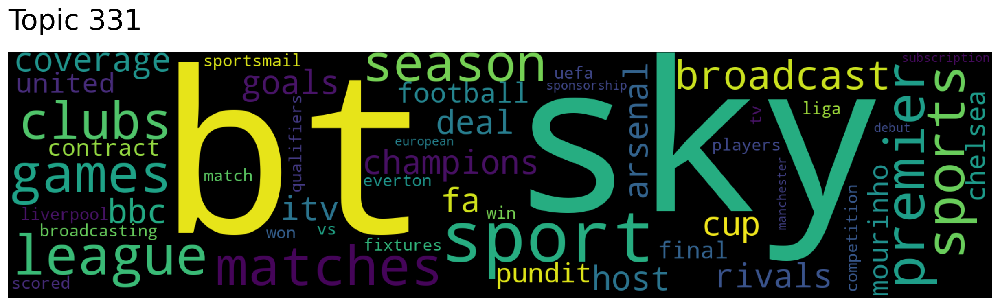

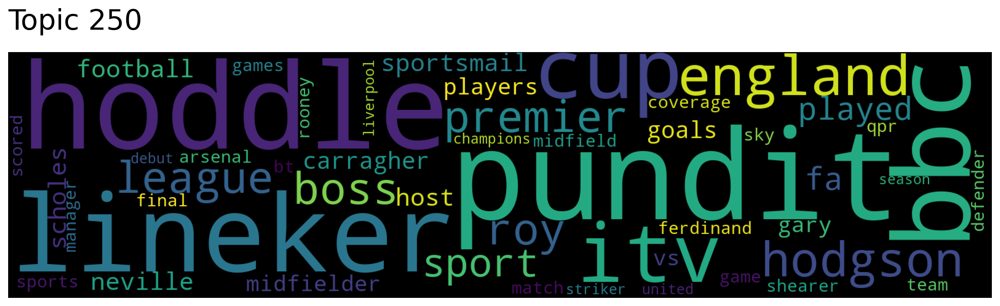

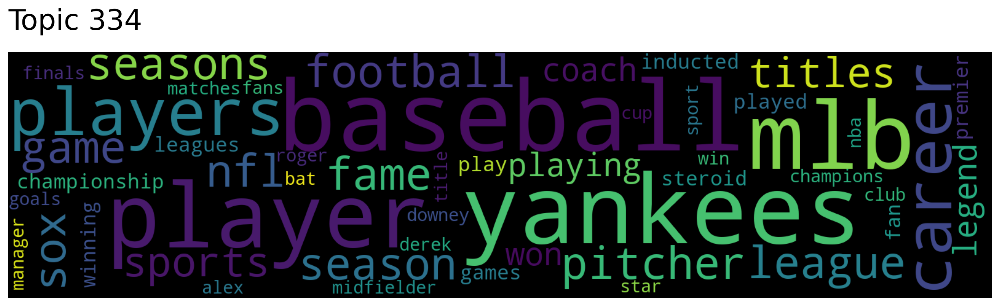

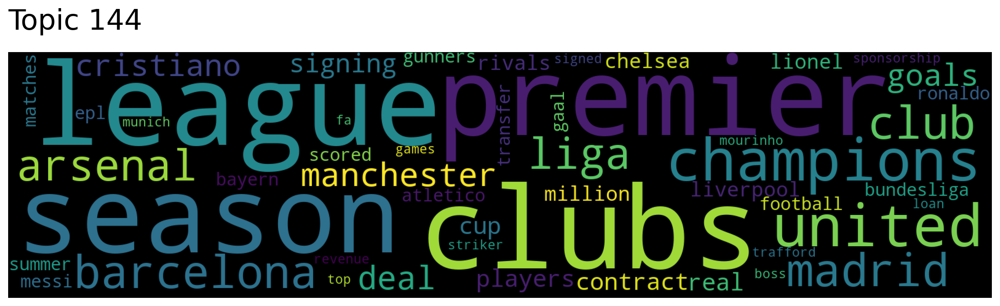

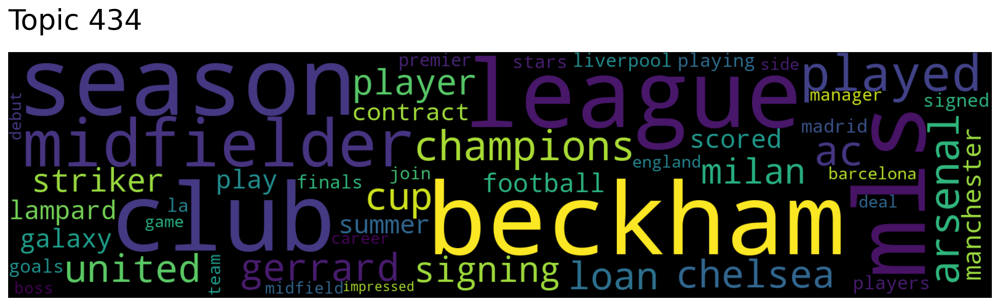

In [22]:
topic_words, word_scores, topic_scores, topic_nums = vec_model.search_topics(keywords=["sports"], num_topics=5, reduced=False)
print("Topic: Sports")
print("Topic indexes: " + str(topic_nums))
vec_model.get_topics()
for topic in topic_nums:
    vec_model.generate_topic_wordcloud(topic)

Topic: Business
Topic indexes: [209  69 108 446 202]


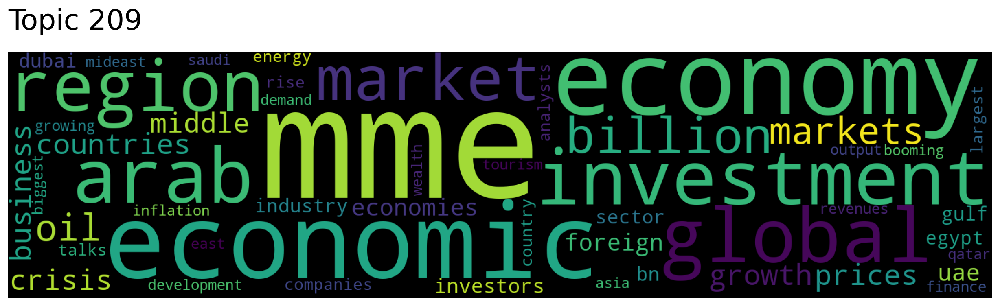

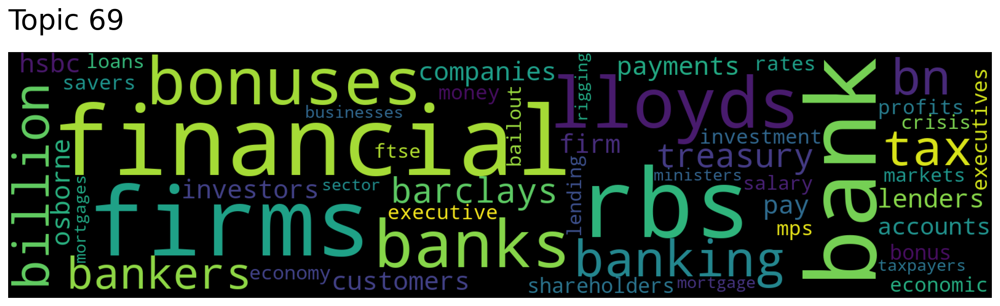

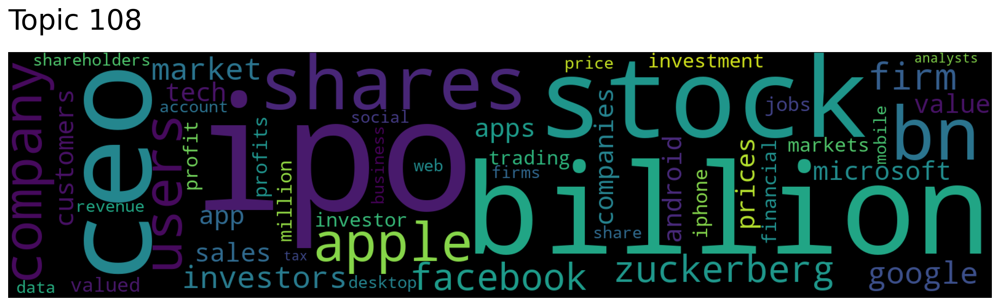

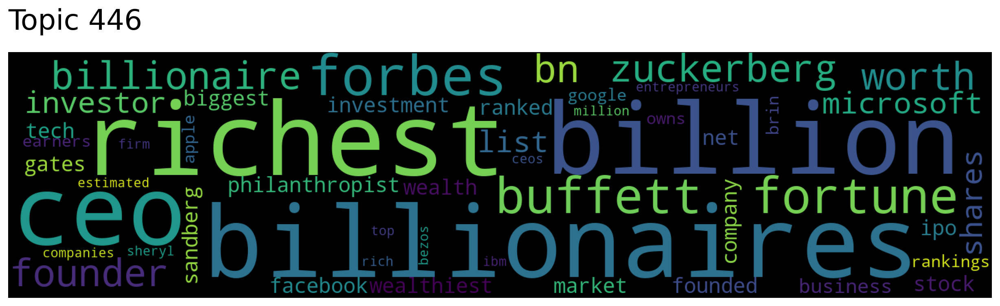

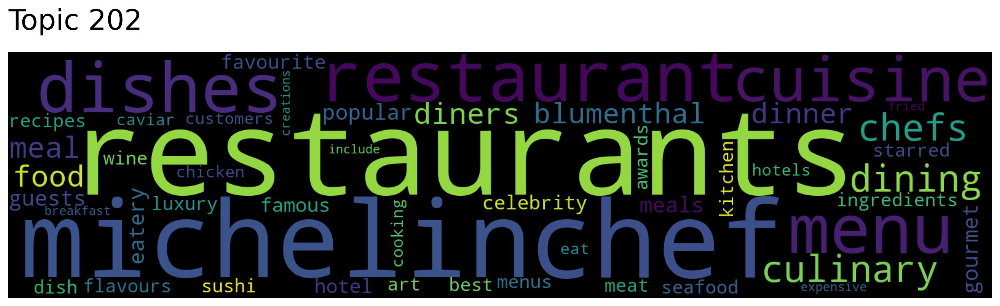

In [24]:
topic_words, word_scores, topic_scores, topic_nums = vec_model.search_topics(keywords=["business"], num_topics=5, reduced=False)
print("Topic: Business")
print("Topic indexes: " + str(topic_nums))
vec_model.get_topics()
for topic in topic_nums:
    vec_model.generate_topic_wordcloud(topic)

Topic: Technology
Topic indexes: [ 26  62  30  55 181]


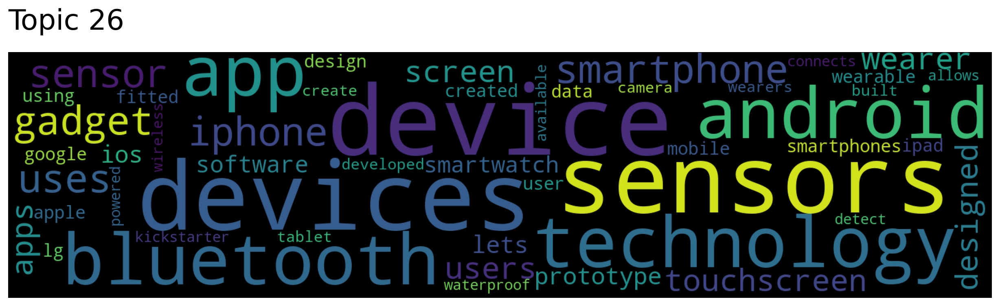

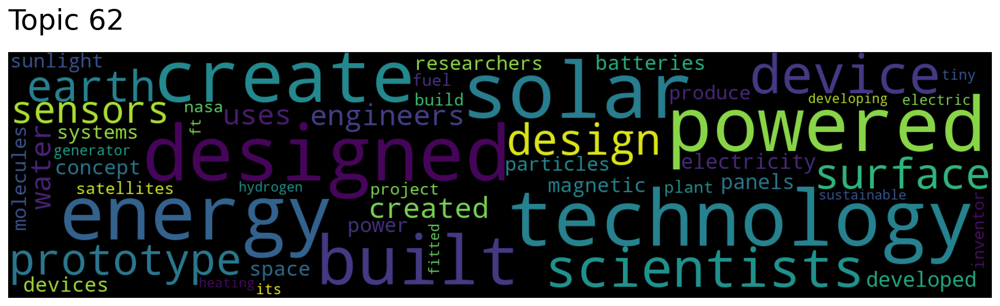

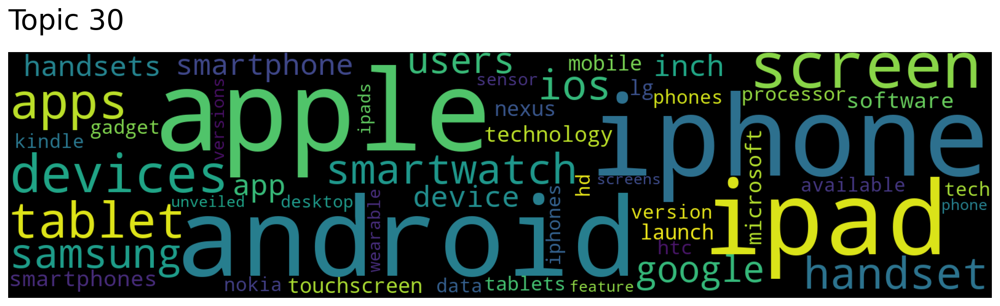

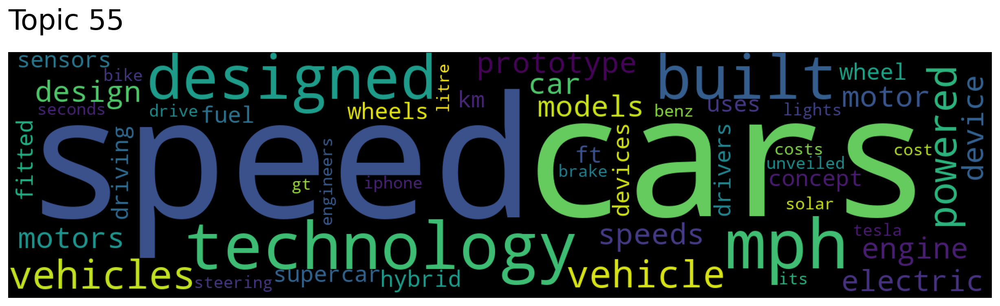

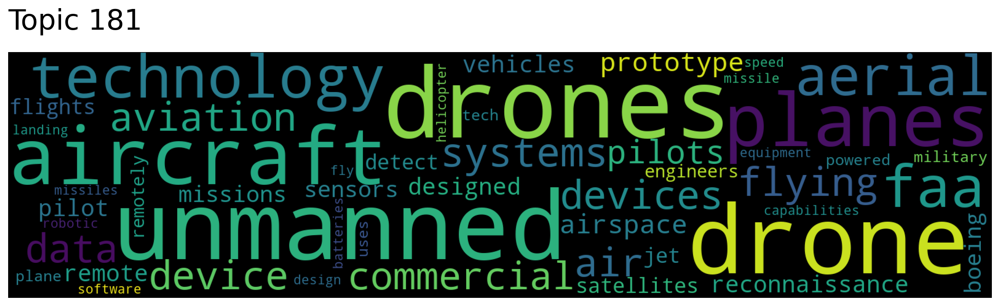

In [25]:
topic_words, word_scores, topic_scores, topic_nums = vec_model.search_topics(keywords=["technology"], num_topics=5, reduced=False)
print("Topic: Technology")
print("Topic indexes: " + str(topic_nums))
vec_model.get_topics()
for topic in topic_nums:
    vec_model.generate_topic_wordcloud(topic)

Topic: Stocks
Topic indexes: [617  58 108 216 192]


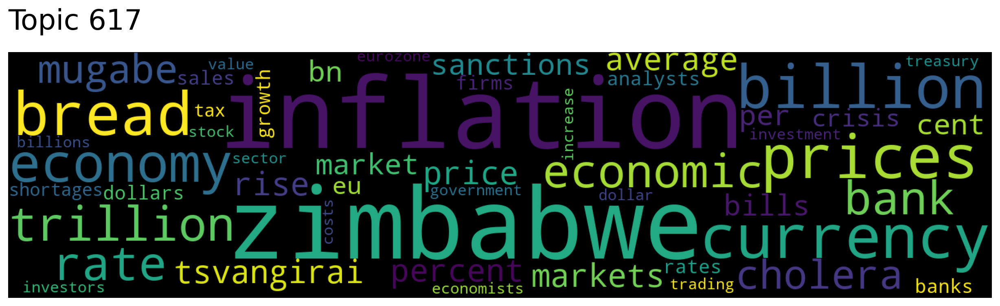

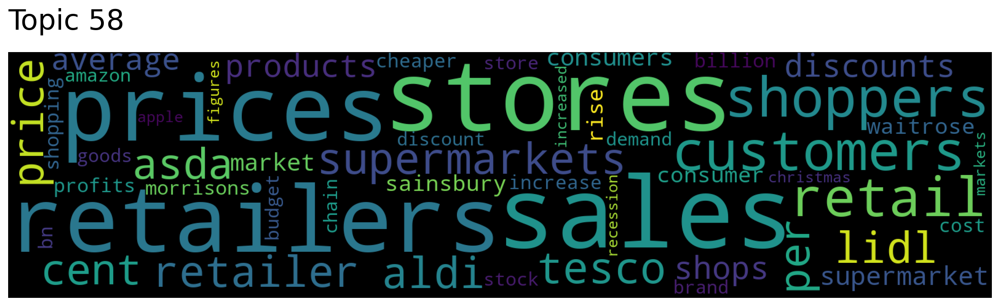

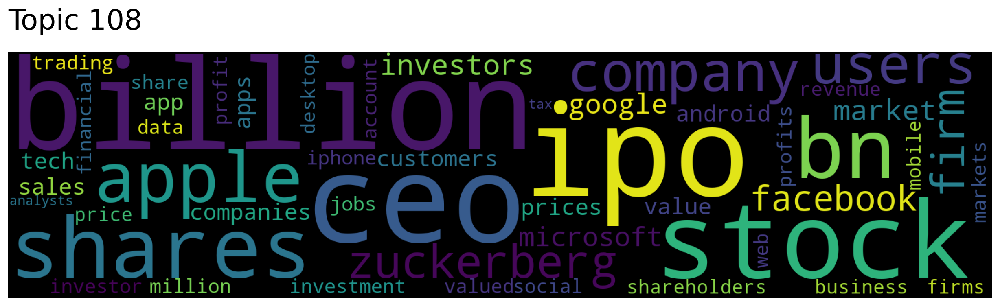

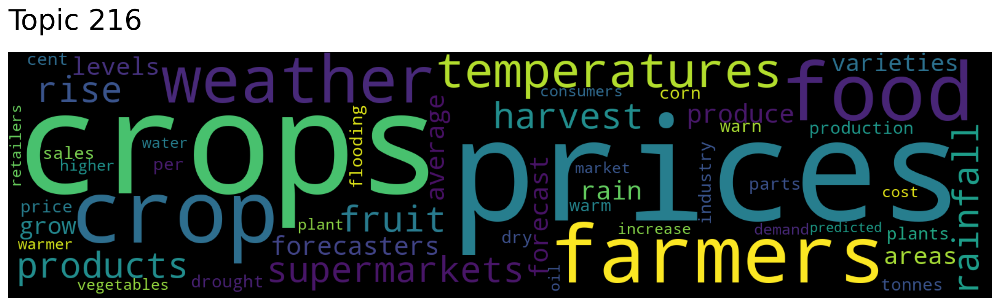

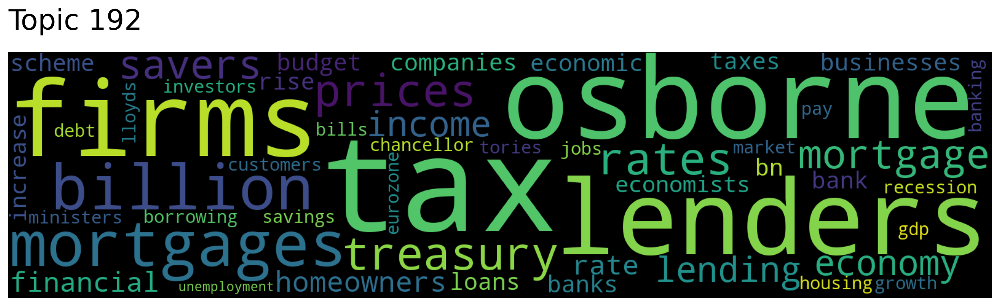

In [26]:
topic_words, word_scores, topic_scores, topic_nums = vec_model.search_topics(keywords=["stocks"], num_topics=5, reduced=False)
print("Topic: Stocks")
print("Topic indexes: " + str(topic_nums))
vec_model.get_topics()
for topic in topic_nums:
    vec_model.generate_topic_wordcloud(topic)